<a href="https://colab.research.google.com/github/alheir/dip-2024-g4/blob/main/DIP_TP4_G4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP4 Procesamiento de Imágenes - Grupo 4



Heir, Alejandro Nahuel (62496)

Mendizabal, Francisco (61454)

Sbruzzi, Juan Francisco (62517)

Vazquez, Agustin (61420)

# Paquetes

In [144]:
import numpy as np
import matplotlib.pyplot as plt

import imageio.v3 as iio

import cv2 as cv

from google.colab import files

# Carga de imágenes

In [77]:
imgzip_fn = 'tp4-images.zip'
imgzip_url = 'https://downloads.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp4-images.zip'

!wget {imgzip_url} -O {imgzip_fn}

!unzip -o {imgzip_fn}

!rm {imgzip_fn}

--2024-09-26 02:56:13--  https://downloads.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp4-images.zip
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Connecting to downloads.sourceforge.net (downloads.sourceforge.net)|204.68.111.105|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://master.dl.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp4-images.zip?viasf=1 [following]
--2024-09-26 02:56:13--  https://master.dl.sourceforge.net/project/dsp-fpga-dip-nn-itba/dip/tp4-images.zip?viasf=1
Resolving master.dl.sourceforge.net (master.dl.sourceforge.net)... 216.105.38.12
Connecting to master.dl.sourceforge.net (master.dl.sourceforge.net)|216.105.38.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1167288 (1.1M) [application/octet-stream]
Saving to: ‘tp4-images.zip’

tp4-images.zip      100%[===================>]   1.11M   911KB/s    in 1.3s    

2024-09-26 02:56:15 (911 KB/s) - ‘tp4-image

# Ejercicio 1

Dada la imagen `lena_gray.tif` se pide obtener:

- a) El negativo de la imagen.
- b) Una transformación tal que convierta los valores entre
$[0.25,\ 0.5]$ al rango $[0,\ 1]$.

Usar `imadjust` de Matlab pero implementarlo en Python.

## a) Negación

Imagen original

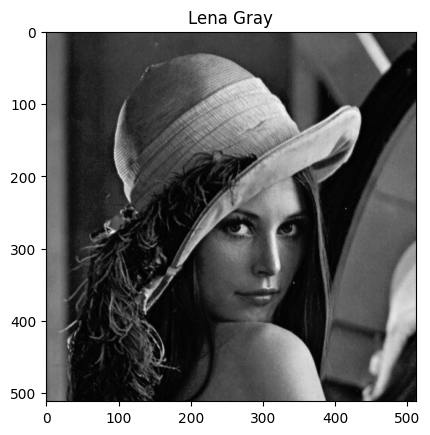

In [78]:
lena = iio.imread('lena_gray.tif')

plt.imshow(lena, cmap='gray')
plt.title('Lena Gray')
plt.show()

In [79]:
print(lena.shape)
print(lena.dtype)
print(lena.min())
print(lena.max())

(512, 512)
uint8
0
227


In [80]:
L = 256

In [81]:
def negative(image, L=256):
    return (L - 1 - image)

Imagen invertida, usando transformación literal

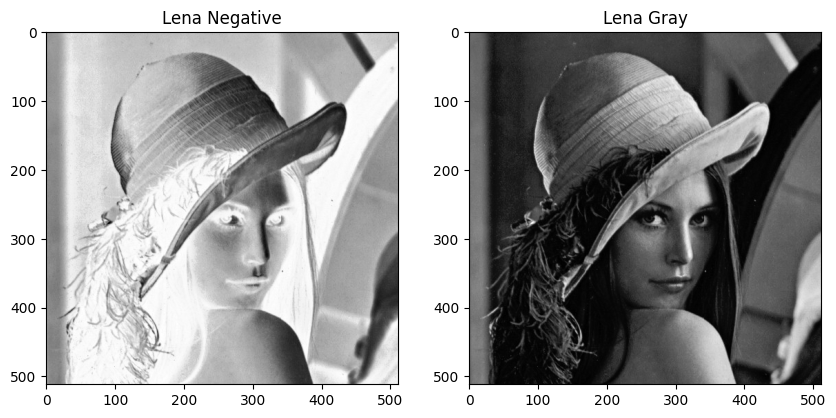

In [82]:
lena_neg = negative(lena, L)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(lena_neg, cmap='gray')
axs[0].set_title('Lena Negative')

axs[1].imshow(lena, cmap='gray')
axs[1].set_title('Lena Gray')

plt.show()

## b) `imadjust`

Transformación personalizada

https://es.mathworks.com/help/images/ref/imadjust.html

`imadjust` mapea el `source_range` al `target_range`. Los pixeles por debajo del `source_range` van a 0, los por encima a 1.

En otros términos, permite ajustar el contraste.

In [83]:
def imadjust(image, source_range, target_range=[0, 1.0], gamma=1.0, L=256):
    image = image.astype('float64')/(L - 1) # 0.0 a 1.0

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if(image[i][j] >= source_range[0] and image[i][j] <= source_range[1]):
                image[i][j] = ((image[i][j] - source_range[0]) / (source_range[1] - source_range[0])) ** gamma
                image[i][j] = image[i][j] * (target_range[1] - target_range[0]) + target_range[0]
            elif(image[i][j] < source_range[0]):
                image[i][j] = 0
            elif(image[i][j] > source_range[1]):
                image[i][j] = 1

    return (image*(L - 1)).astype('uint8') # 0 a 255

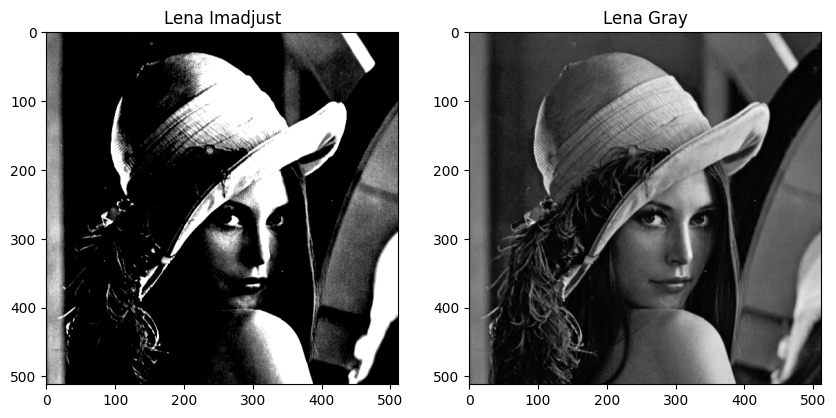

In [84]:
source_range = [0.25, 0.5]
target_range = [0, 1.0]

lena_imadjust = imadjust(lena, source_range, target_range)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(lena_imadjust, cmap='gray')
axs[0].set_title('Lena Imadjust')

axs[1].imshow(lena, cmap='gray')
axs[1].set_title('Lena Gray')

plt.show()

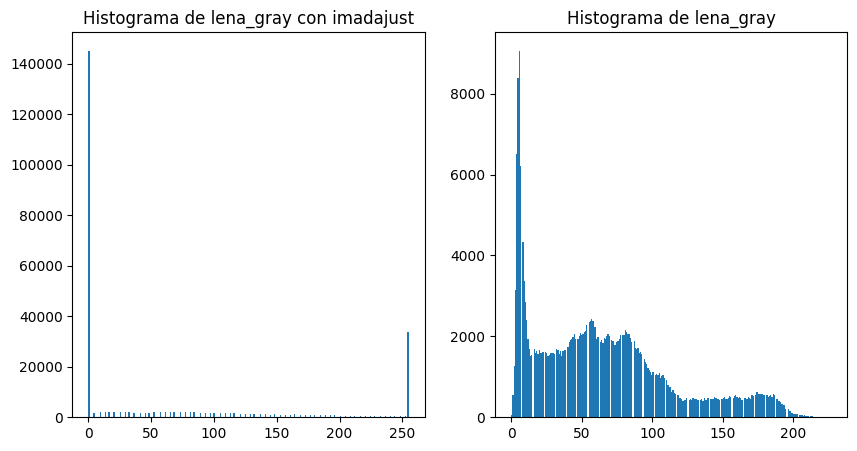

In [85]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].hist(lena_imadjust.flatten(), bins=256)
axs[0].set_title('Histograma de lena_gray con imadajust')

axs[1].hist(lena.flatten(), bins=256)
axs[1].set_title('Histograma de lena_gray')

plt.show()

> Se observa la saturación a los niveles 255 y, principalmente, 0. Entre medio se ubica el mapeo del rango [0.25, 0.5] al [0, 1]

Se ensayan otro rangos de transformación para observar el efecto sobre el contraste.

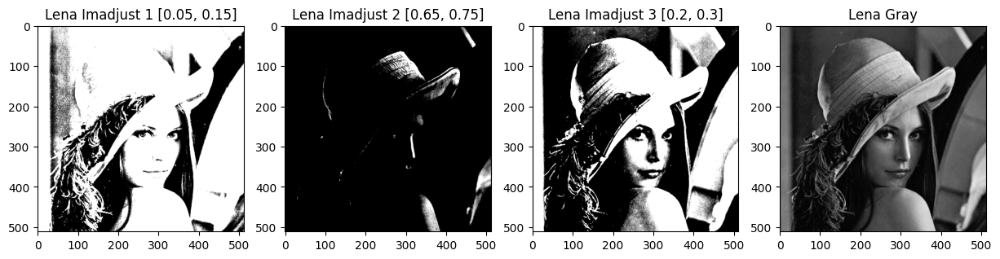

In [86]:
source_range_1 = [0.05, 0.15]
lena_imadjust_1 = imadjust(lena, source_range_1, target_range)

source_range_2 = [0.65, 0.75]
lena_imadjust_2 = imadjust(lena, source_range_2, target_range)

source_range_3 = [0.2, 0.3]
lena_imadjust_3 = imadjust(lena, source_range_3, target_range)

fig, axs = plt.subplots(1, 4, figsize=(15, 5))

axs[0].imshow(lena_imadjust_1, cmap='gray')
axs[0].set_title(f'Lena Imadjust 1 {source_range_1}')

axs[1].imshow(lena_imadjust_2, cmap='gray')
axs[1].set_title(f'Lena Imadjust 2 {source_range_2}')

axs[2].imshow(lena_imadjust_3, cmap='gray')
axs[2].set_title(f'Lena Imadjust 3 {source_range_3}')

axs[3].imshow(lena, cmap='gray')
axs[3].set_title('Lena Gray')

plt.show()


# Ejercicio 2



Dada la imagen del globo ocular buscar transformaciones que permitan
resaltar las venas lo mejor posible (imagen `eyebw.jpg`).

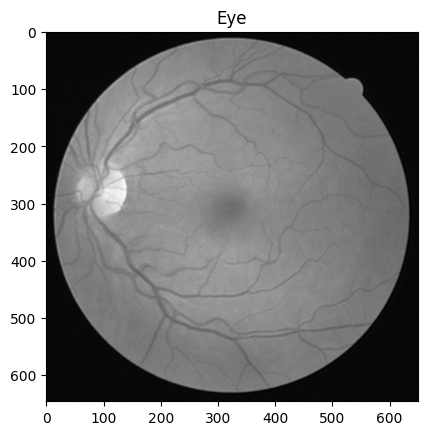

In [87]:
eye = iio.imread('eyebw.jpg', mode='L')

plt.imshow(eye, cmap='gray')
plt.title('Eye')
plt.show()

In [88]:
print(eye.shape)
print(eye.dtype)

(646, 650)
uint8


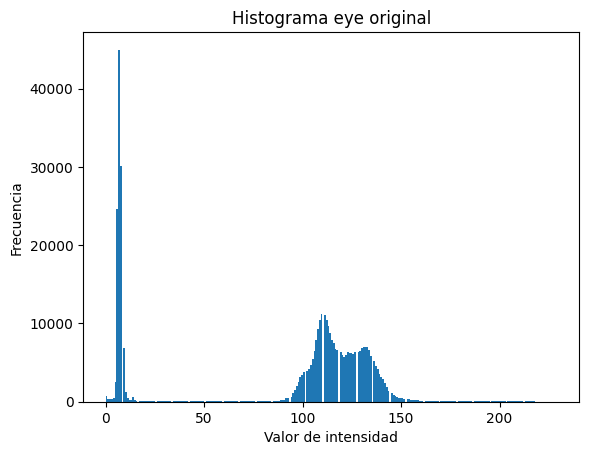

In [89]:
plt.hist(eye.flatten(), bins=256)
plt.title('Histograma eye original')
plt.xlabel('Valor de intensidad')
plt.ylabel('Frecuencia')
plt.show()

> Mucha baja frecuencia por el fill negro de la imagen

## Negativa

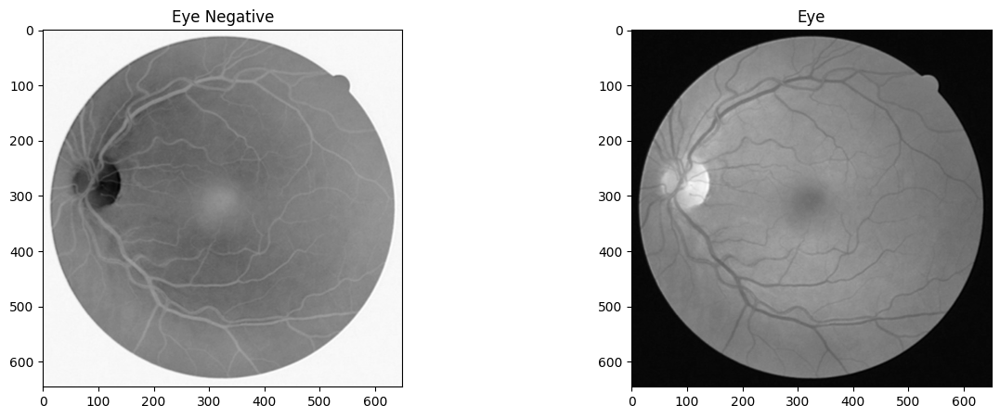

In [90]:
eye_neg = negative(eye)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_neg, cmap='gray')
axs[0].set_title('Eye Negative')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

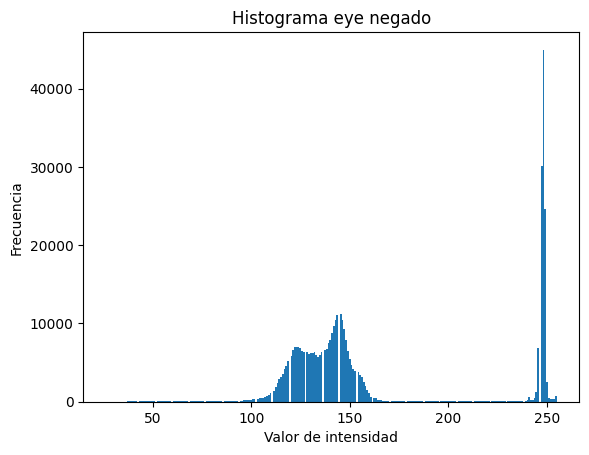

In [91]:
plt.hist(eye_neg.flatten(), bins=256)
plt.title('Histograma eye negado')
plt.xlabel('Valor de intensidad')
plt.ylabel('Frecuencia')
plt.show()

## Contraste

Adaptación de constraste sobre la imagen negada

In [92]:
src_rng = [0.4, 0.6]

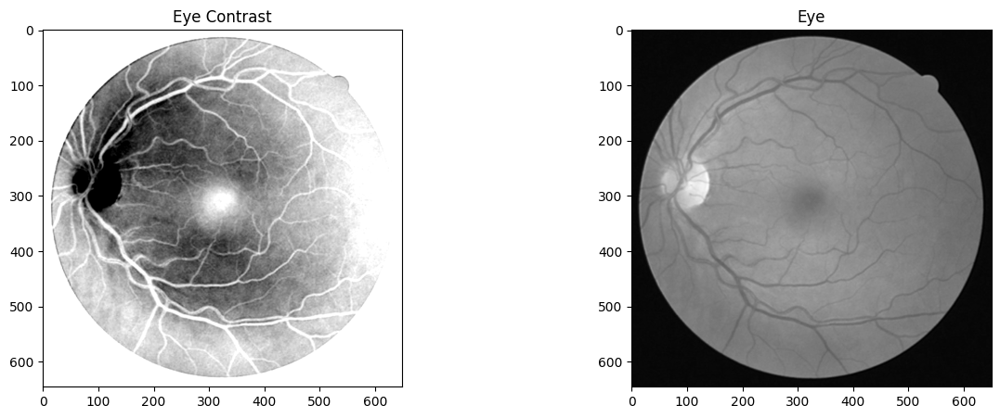

In [93]:
eye_contr = imadjust(eye_neg, src_rng, [0, 1.0])

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_contr, cmap='gray')
axs[0].set_title('Eye Contrast')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

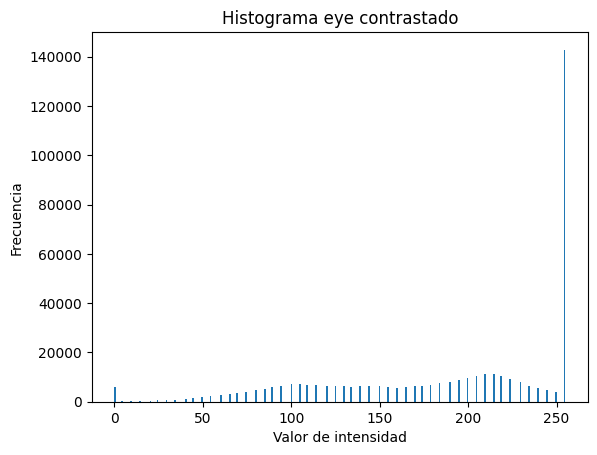

In [94]:
plt.hist(eye_contr.flatten(), bins=256)
plt.title('Histograma eye contrastado')
plt.xlabel('Valor de intensidad')
plt.ylabel('Frecuencia')
plt.show()

> Nuevamente, se observa la saturación, ahora en mayor medida al nivel máximo.

## Contraste + $\gamma$

Variando el $\gamma$

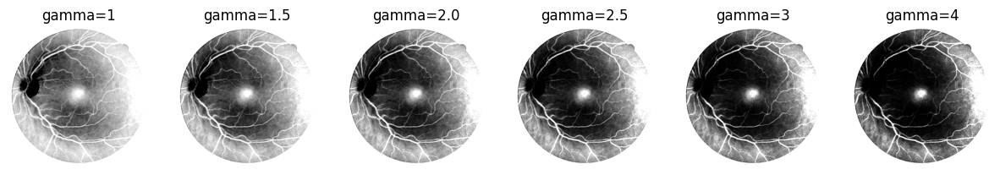

In [95]:
gamma_values = [1, 1.5, 2.0, 2.5, 3, 4]

fig, axs = plt.subplots(1, len(gamma_values), figsize=(15, 5))

for i, gamma in enumerate(gamma_values):
    eye_contr = imadjust(eye_neg, src_rng, [0, 1.0], gamma=gamma)
    axs[i].imshow(eye_contr, cmap='gray')
    axs[i].set_title(f'gamma={gamma}')
    axs[i].axis('off')

plt.show()

## Logarítmica

In [96]:
def logarithm(image, c=1.0, L=256, clipping=False):
    image = image.astype('float64')/(L - 1) # 0.0 a 1.0

    image = c * np.log1p(image) # log1p(x) means log(1 + x)
    if(clipping):
        image = np.clip(image, 0, 1)

    return (image*(L - 1)).astype('uint8') # 0 a 255

Sin clipping

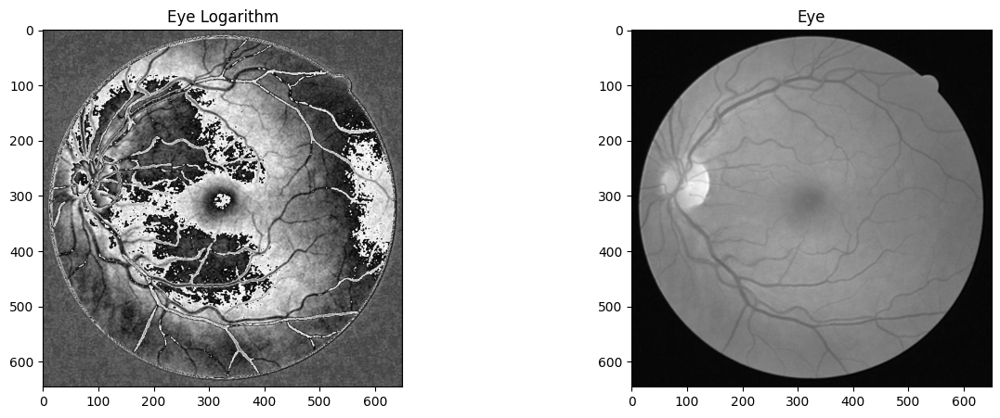

In [97]:
eye_log = logarithm(eye, c=12)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_log, cmap='gray')
axs[0].set_title('Eye Logarithm')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

without clipping


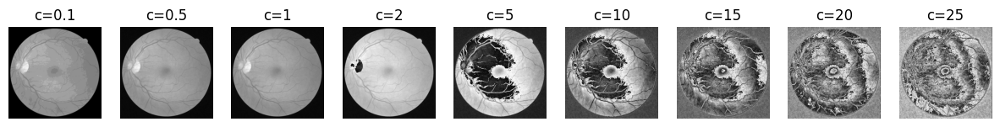



clipping


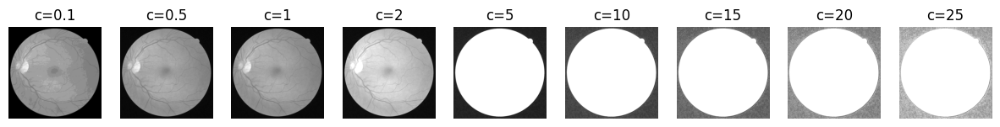

In [98]:
c_values = [0.1, 0.5, 1, 2, 5, 10, 15, 20, 25]

print("without clipping")

fig, axs = plt.subplots(1, len(c_values), figsize=(15, 5))

for i, c in enumerate(c_values):
    eye_log = logarithm(eye, c=c)
    axs[i].imshow(eye_log, cmap='gray')
    axs[i].set_title(f'c={c}')
    axs[i].axis('off')

plt.show()

print("\n\nclipping")

fig, axs = plt.subplots(1, len(c_values), figsize=(15, 5))

for i, c in enumerate(c_values):
    eye_log = logarithm(eye, c=c, clipping=True)
    axs[i].imshow(eye_log, cmap='gray')
    axs[i].set_title(f'c={c}')
    axs[i].axis('off')

plt.show()

## Exponencial logarítmica

In [99]:
def explog(image, c=1.0, L=256, clipping=False, gamma=1.0):
    image = image.astype('float64')/(L - 1) # 0.0 a 1.0

    image = c * (image ** gamma)
    if(clipping):
        image = np.clip(image, 0, 1)

    return (image*(L - 1)).astype('uint8') # 0 a 255

A partir de la negada+contrastada

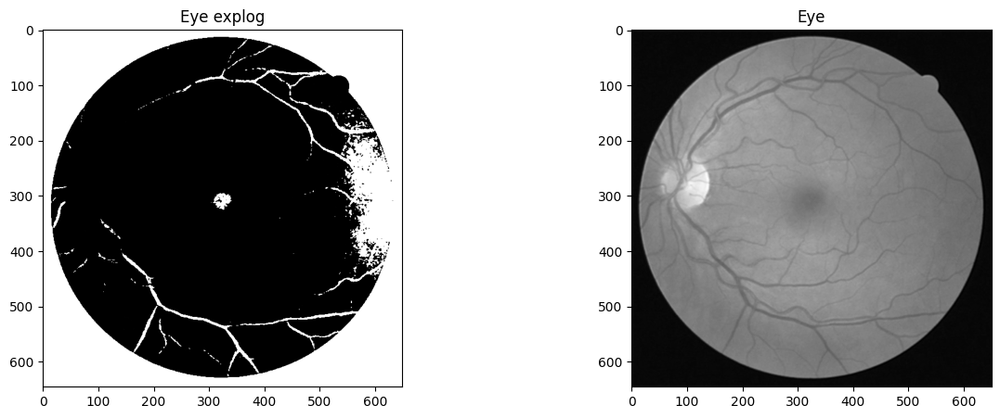

In [100]:
eye_explog = explog(eye_contr, c=1, gamma=50, clipping=True)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_explog, cmap='gray')
axs[0].set_title('Eye explog')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

Barrido de $c$ y $\gamma$ para explog

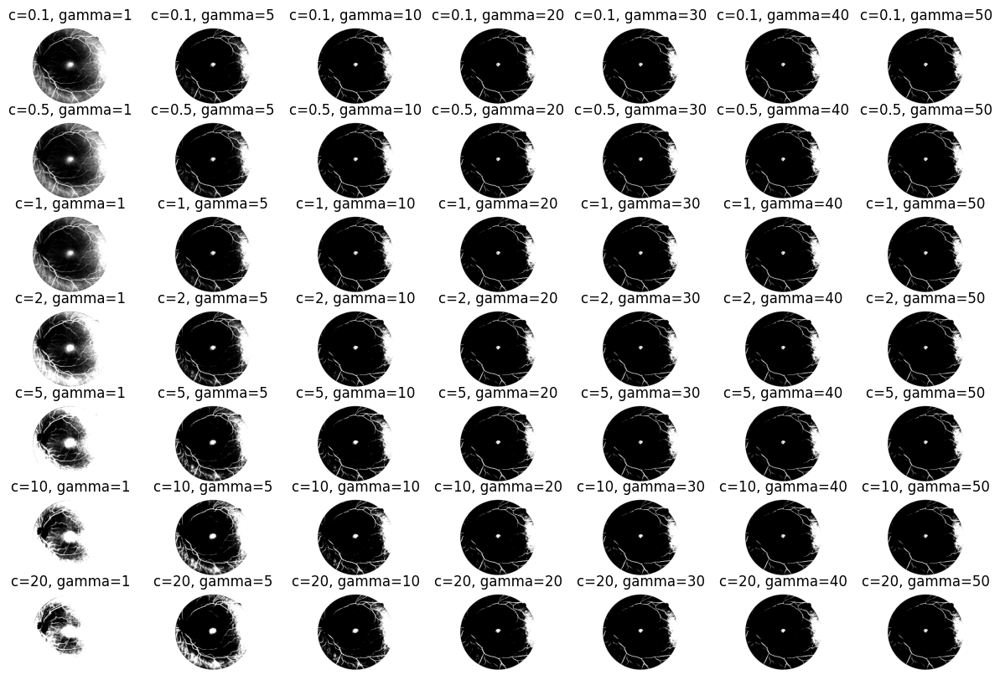

In [101]:
c_values = [0.1, 0.5, 1, 2, 5, 10, 20]
gamma_values = [1, 5, 10, 20, 30, 40, 50]

fig, axs = plt.subplots(len(c_values), len(gamma_values), figsize=(15, 10))

for i, c in enumerate(c_values):
  for j, gamma in enumerate(gamma_values):
    eye_explog = explog(eye_contr, c=c, gamma=gamma, clipping=True)
    axs[i, j].imshow(eye_explog, cmap='gray')
    axs[i, j].set_title(f'c={c}, gamma={gamma}')
    axs[i, j].axis('off')

plt.show()

## Por tramos lineales

In [102]:
def linsecs(image, src_rng=[0, 1], trgt_rng=[0,1], L=256):
    if(src_rng == trgt_rng): # lineal
        return image

    image = image.astype('float64')/(L - 1) # 0.0 a 1.

    r1, r2 = src_rng
    s1, s2 = trgt_rng

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):

            if(r1 != r2): # lineal
                if r1 <= image[i, j] <= r2: # zona intermedia
                    image[i, j] = s1 + (image[i, j] - r1) * (s2 - s1) / (r2 - r1) # mapeo

            elif image[i, j] < r1:
                image[i, j] = s1 # satura

            elif image[i, j] > r2:
                image[i, j] = s2 # satura

    return (image*(L - 1)).astype('uint8') # 0 a 255

In [103]:
print(eye.min())
print(eye.max())

0
229


Similar a `imadjust` si se mantiene el `target_range` de $0$ a $L-1$ (0 a 1)

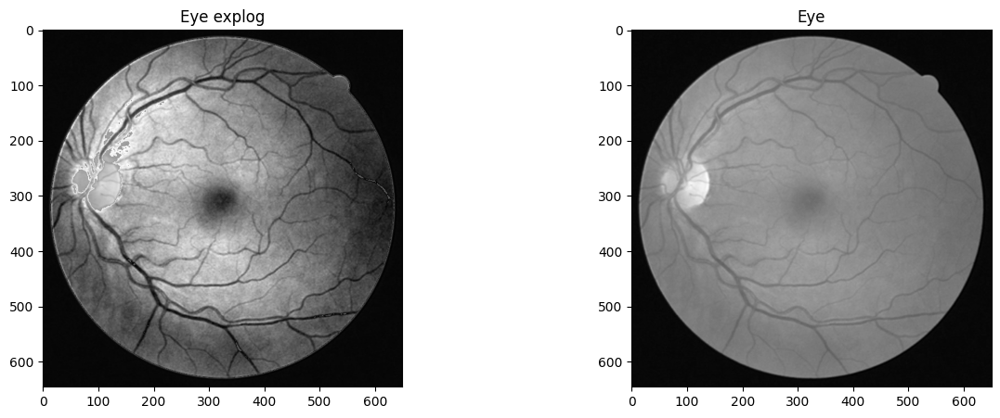

In [104]:
eye_linsec = linsecs(eye, [0.35, 0.6])

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_linsec, cmap='gray')
axs[0].set_title('Eye explog')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

### Contrast streching

In [105]:
mean_lvl = np.mean(eye)
print(mean_lvl)
mean_lvl = float(mean_lvl) / (L - 1)
print(mean_lvl)

88.85698975946654
0.34845878337045705


Usando nivel medio

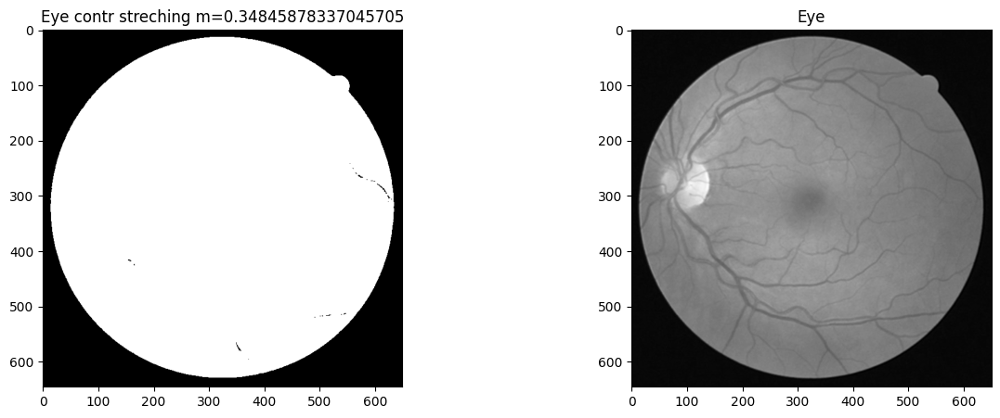

In [106]:
eye_contr_strch = linsecs(eye, [mean_lvl, mean_lvl])

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_contr_strch, cmap='gray')
axs[0].set_title(f'Eye contr streching m={mean_lvl}')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

Usando otro nivel, mayor al medio

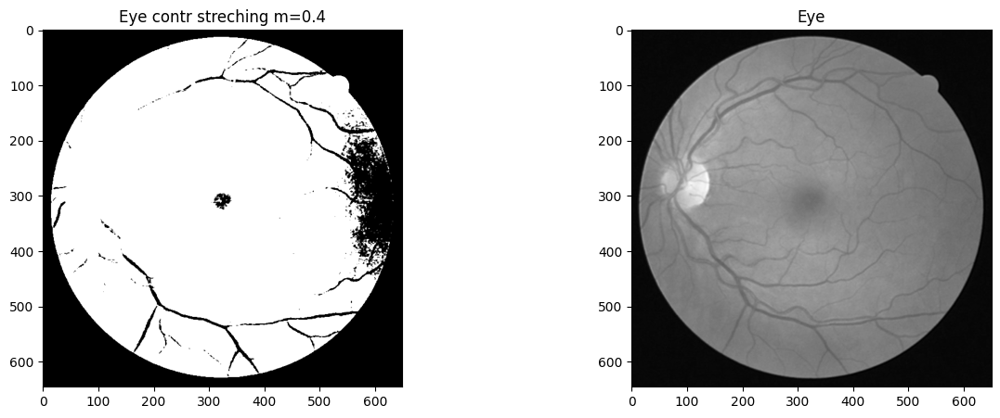

In [107]:
lvl_threshold = 0.4

eye_contr_strch = linsecs(eye, [lvl_threshold, lvl_threshold])

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_contr_strch, cmap='gray')
axs[0].set_title(f'Eye contr streching m={lvl_threshold}')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

Barriendo el nivel

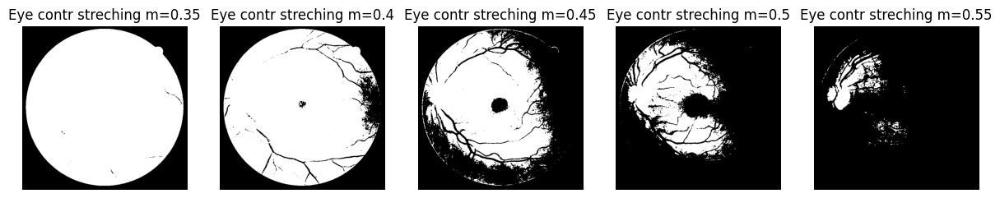

In [108]:
lvl_threshold_values = np.arange(0.35, 0.6, 0.05)

fig, axs = plt.subplots(1, len(lvl_threshold_values), figsize=(15, 15))

for i, lvl_threshold in enumerate(lvl_threshold_values):
    eye_contr_strch = linsecs(eye, [lvl_threshold, lvl_threshold])
    axs[i].imshow(eye_contr_strch, cmap='gray')
    axs[i].set_title(f'Eye contr streching m={round(lvl_threshold, 3)}')
    axs[i].axis('off')

plt.show()

### Gray level slicing

Solo mantiene (o amplifica o atenúa) el rango de nivel dado, poniendo a cero el resto

In [109]:
def gray_level_slicing(image, src_rng=[0, 1], gain=1.0, L=256):
    image = image.astype('float64')/(L - 1) # 0.0 a 1.0

    r1, r2 = src_rng

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if r1 <= image[i, j] <= r2: # zona intermedia
                image[i, j] = 0
            else:
                image[i, j] *= gain

    image = np.clip(image, 0, 1)

    return (image*(L - 1)).astype('uint8') # 0 a 255

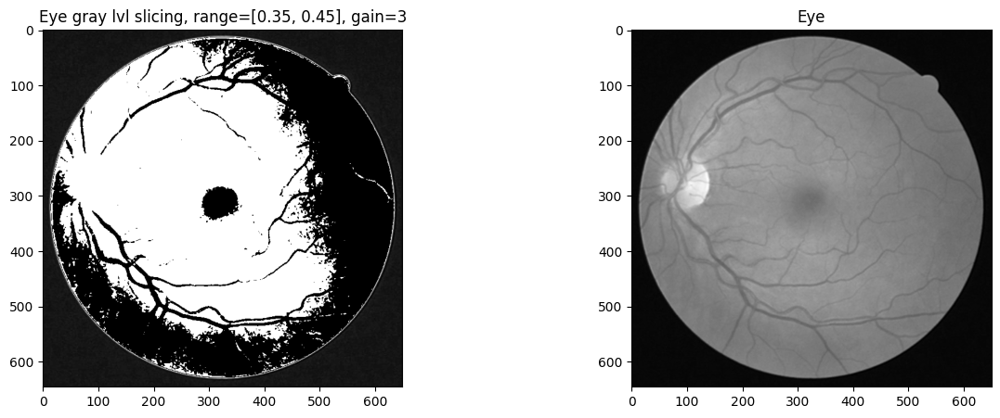

In [110]:
range_lvl = [0.35, 0.45]
gain = 3

eye_gray_lvl_slc = gray_level_slicing(eye, range_lvl, gain=gain)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(eye_gray_lvl_slc, cmap='gray')
axs[0].set_title(f'Eye gray lvl slicing, range={range_lvl}, gain={gain}')

axs[1].imshow(eye, cmap='gray')
axs[1].set_title('Eye')

plt.show()

Barriendo distintas ventanas de nivel, con distintas ganancia

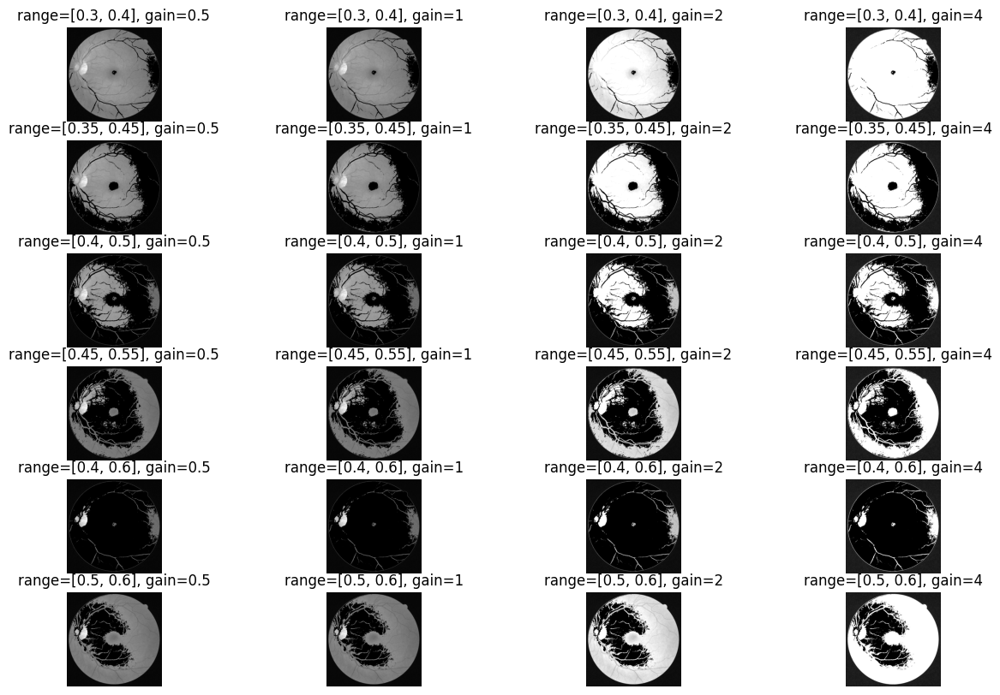

In [111]:
range_lvl_values = [[0.3, 0.4], [0.35, 0.45], [0.4, 0.5], [0.45, 0.55], [0.4, 0.6], [0.5, 0.6]]
gain_values = [0.5, 1, 2, 4]

fig, axs = plt.subplots(len(range_lvl_values), len(gain_values), figsize=(15, 10))

for i, range_lvl in enumerate(range_lvl_values):
  for j, gain in enumerate(gain_values):
    eye_gray_lvl_slc = gray_level_slicing(eye, range_lvl, gain=gain)
    axs[i, j].imshow(eye_gray_lvl_slc, cmap='gray')
    axs[i, j].set_title(f'range={range_lvl}, gain={gain}')
    axs[i, j].axis('off')

plt.show()

# Ejercicio 3 - Bit Plane Slicing
- a) Reproducir ejemplo de la teoría
- b) Dada la imagen `onedollar.jpg`, convertila a niveles de gris y mostrar todos los bit-planes (8 bit). A partir de los bit-planes obtenidos, reconstruir la imagen usando diferentes bit-planes (experimentar usando los planos 8-7-6-5-1).

## a) Fractal

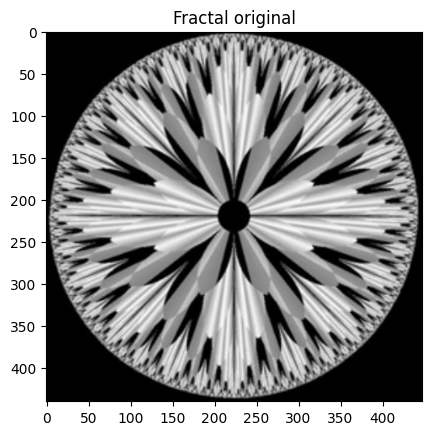

In [112]:
fractal = iio.imread('8 bit fractal (gonzales - woods).png', mode='L')

plt.imshow(fractal, cmap='gray')
plt.title('Fractal original')
plt.show()

In [113]:
print(fractal.shape)
print(fractal.dtype)
print(fractal.min())
print(fractal.max())

(440, 448)
uint8
0
220


In [114]:
def bit_plane_slicing(image, n_plane=7, L=256):
    image_copy = np.copy(image)

    for i in range(image_copy.shape[0]):
        for j in range(image_copy.shape[1]):
            if((image_copy[i, j] >> n_plane) & 0b1): # si es no nulo
                image_copy[i, j] = (L - 1)
            else:
                image_copy[i, j] = 0

    return image_copy

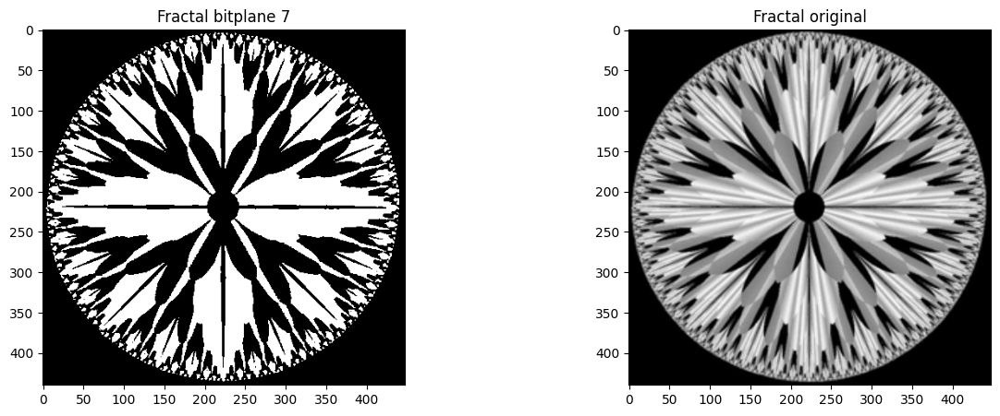

In [115]:
fractal_bp7 = bit_plane_slicing(fractal)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(fractal_bp7, cmap='gray')
axs[0].set_title('Fractal bitplane 7')

axs[1].imshow(fractal, cmap='gray')
axs[1].set_title('Fractal original')

plt.show()

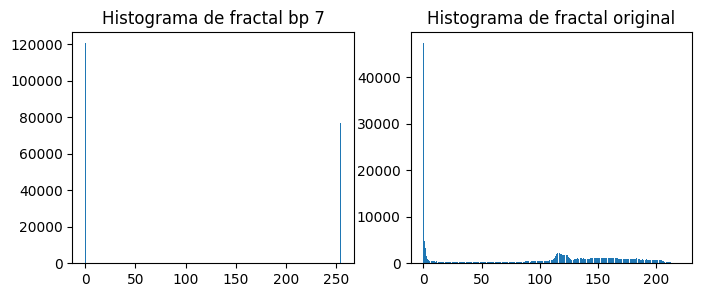

In [116]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3))

axs[0].hist(fractal_bp7.flatten(), bins=256)
axs[0].set_title('Histograma de fractal bp 7')

axs[1].hist(fractal.flatten(), bins=256)
axs[1].set_title('Histograma de fractal original')

plt.show()


> Como se espera, solo los niveles $\geq 128 = 2^7$ de la imagen original se mapean a $255$ para el caso de bitplane 7. Los demás, se anulan.

Fractal bitplane 0:
  - Píxeles con valor 0: 121087
  - Píxeles con valor 255: 76033

Fractal bitplane 1:
  - Píxeles con valor 0: 122975
  - Píxeles con valor 255: 74145

Fractal bitplane 2:
  - Píxeles con valor 0: 125547
  - Píxeles con valor 255: 71573

Fractal bitplane 3:
  - Píxeles con valor 0: 129325
  - Píxeles con valor 255: 67795

Fractal bitplane 4:
  - Píxeles con valor 0: 122512
  - Píxeles con valor 255: 74608

Fractal bitplane 5:
  - Píxeles con valor 0: 123817
  - Píxeles con valor 255: 73303

Fractal bitplane 6:
  - Píxeles con valor 0: 139451
  - Píxeles con valor 255: 57669

Fractal bitplane 7:
  - Píxeles con valor 0: 120383
  - Píxeles con valor 255: 76737



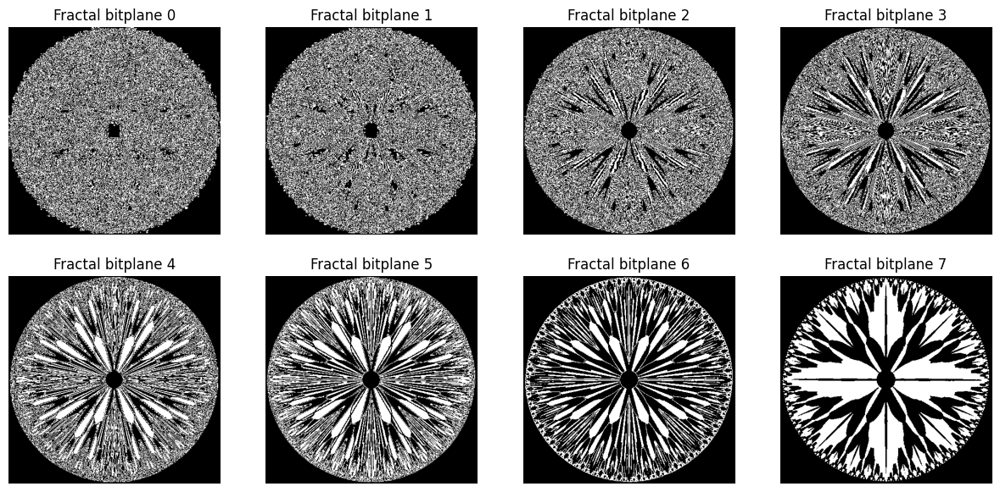

In [117]:
fig, axs = plt.subplots(2, 4, figsize=(15, 7))

for i in range(8):
  fractal_bp = bit_plane_slicing(fractal, n_plane=i)

  num_pixels_0 = np.count_nonzero(fractal_bp == 0)
  num_pixels_255 = np.count_nonzero(fractal_bp == 255)

  print(f"Fractal bitplane {i}:")
  print(f"  - Píxeles con valor 0: {num_pixels_0}")
  print(f"  - Píxeles con valor 255: {num_pixels_255}\n")

  row = i // 4
  col = i % 4

  axs[row, col].imshow(fractal_bp, cmap='gray')
  axs[row, col].set_title(f'Fractal bitplane {i}')
  axs[row, col].axis('off')

plt.show()

## b) Dollar

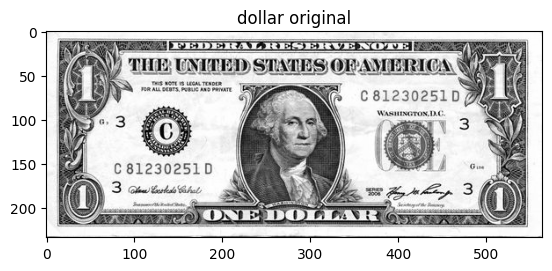

In [118]:
dollar = iio.imread('onedollar.jpg', mode='L')

plt.imshow(dollar, cmap='gray')
plt.title('dollar original')
plt.show()

In [119]:
print(dollar.shape)
print(dollar.dtype)
print(dollar.min())
print(dollar.max())

(234, 564)
uint8
0
255


In [120]:
dollar_bitplanes = []
for i in range(8):
  dollar_bitplanes.append(bit_plane_slicing(dollar, n_plane=i))

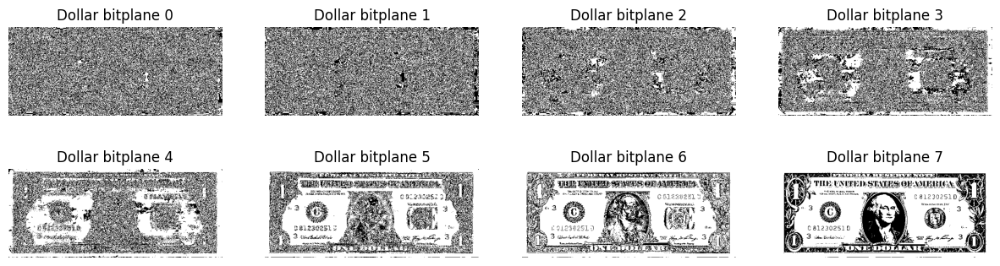

In [121]:
fig, axs = plt.subplots(2, 4, figsize=(15, 4))

for i in range(8):
  row = i // 4
  col = i % 4

  axs[row, col].imshow(dollar_bitplanes[i], cmap='gray')
  axs[row, col].set_title(f'Dollar bitplane {i}')
  axs[row, col].axis('off')

plt.show()

In [122]:
def restore_with_bplanes(bps, bp_sel):
    image = np.zeros_like(bps[0])

    for i in bp_sel:
        # print(f"Restoring with bitplane {i}")
        image += (bps[i].astype(np.uint16) + 1 >> (8 - i)).astype(np.uint8)

        # con i=7: se lleva el nivel a L (256) y se lo divide por 2 (>> 8-7), quedando 128
        # con i=0: se lleva el nivel a L (256) y se lo divide por 256 (>> 8-0), quedando 1

    return image

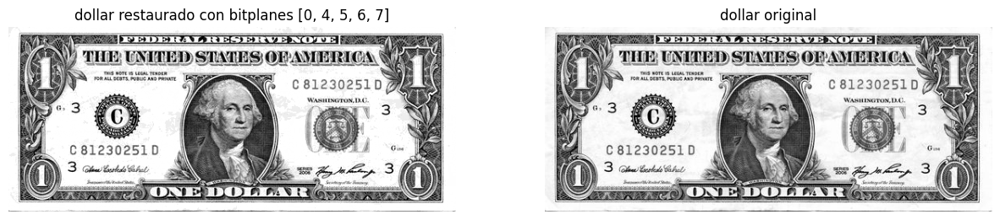

In [123]:
bps_selection = [0, 4, 5, 6, 7]
restored_dollar = restore_with_bplanes(dollar_bitplanes, bps_selection)

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].imshow(restored_dollar, cmap='gray')
axs[0].set_title(f'dollar restaurado con bitplanes {bps_selection}')
axs[0].axis('off')

axs[1].imshow(dollar, cmap='gray')
axs[1].set_title(f'dollar original')
axs[1].axis('off')

plt.show()

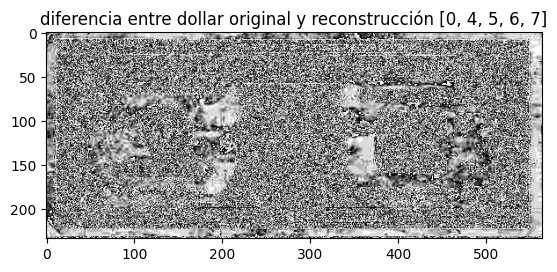

In [124]:
dollar_diff = dollar - restored_dollar

plt.imshow(dollar_diff, cmap='gray')
plt.title(f'diferencia entre dollar original y reconstrucción {bps_selection}')
plt.show()

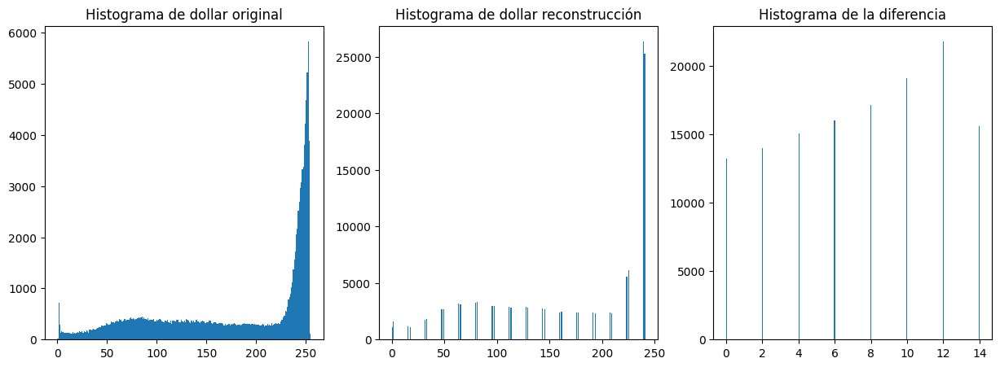

In [125]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].hist(dollar.flatten(), bins=256)
axs[0].set_title('Histograma de dollar original')

axs[1].hist(restored_dollar.flatten(), bins=256)
axs[1].set_title('Histograma de dollar reconstrucción')

axs[2].hist(dollar_diff.flatten(), bins=256)
axs[2].set_title('Histograma de la diferencia')

plt.show()

Veamos cómo mejora la reconstrucción partiendo solo del bitplane 7, agregando los demás.

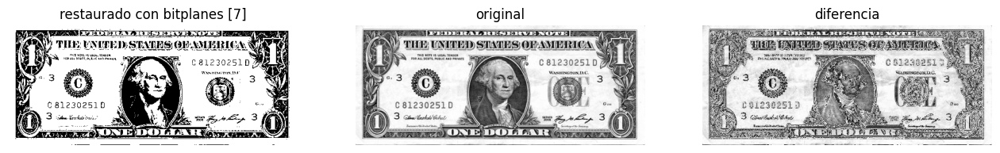

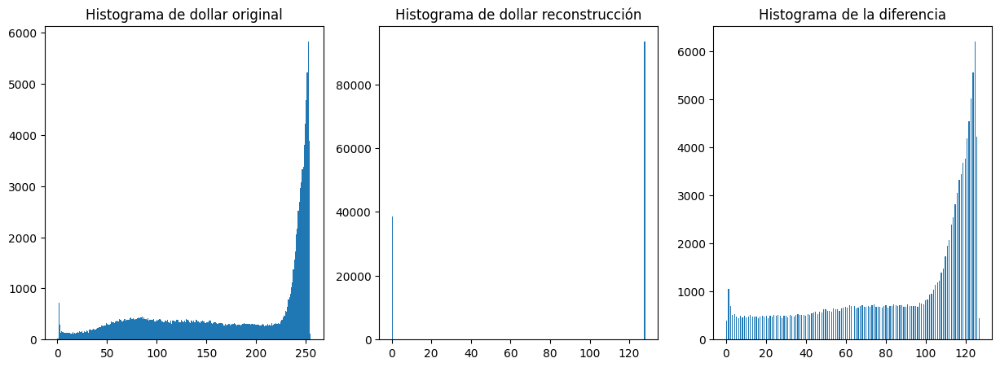

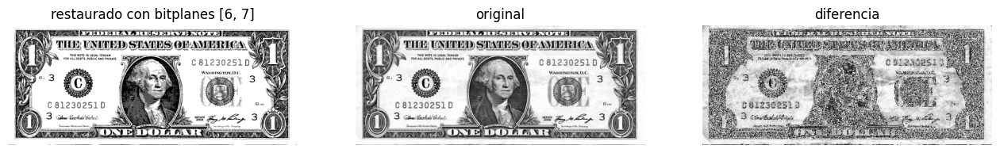

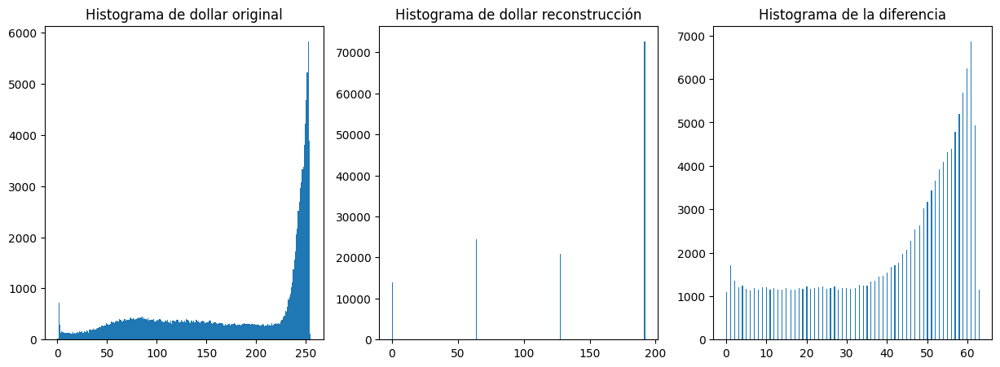

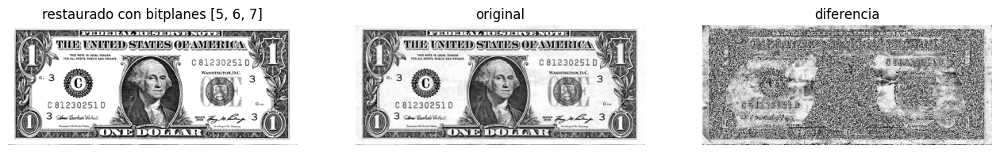

...

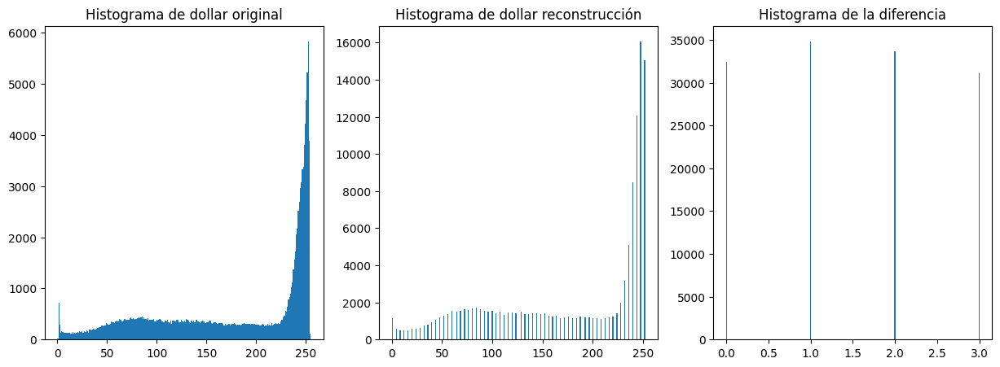

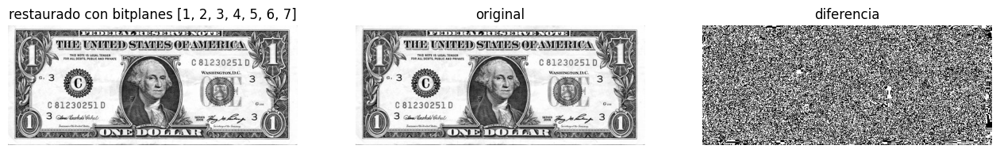

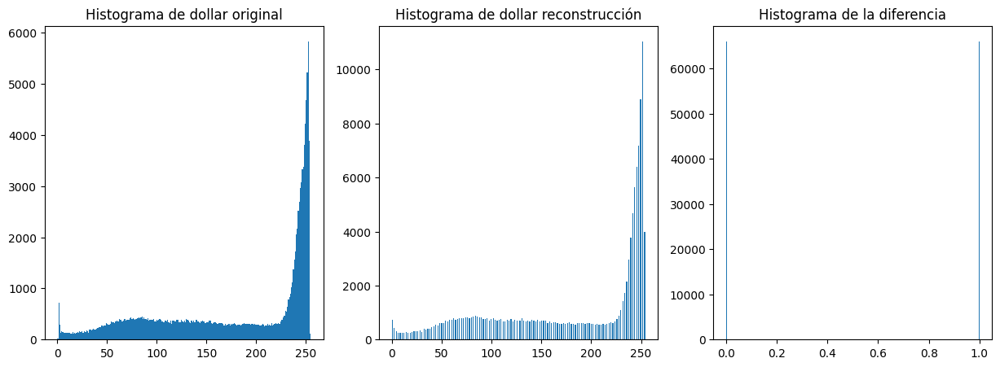

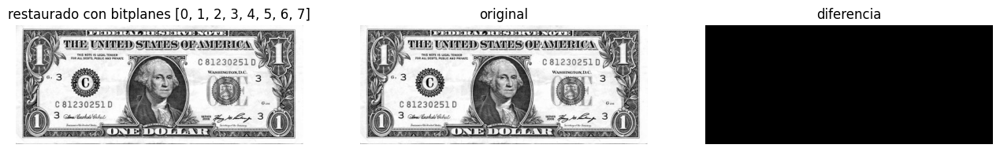

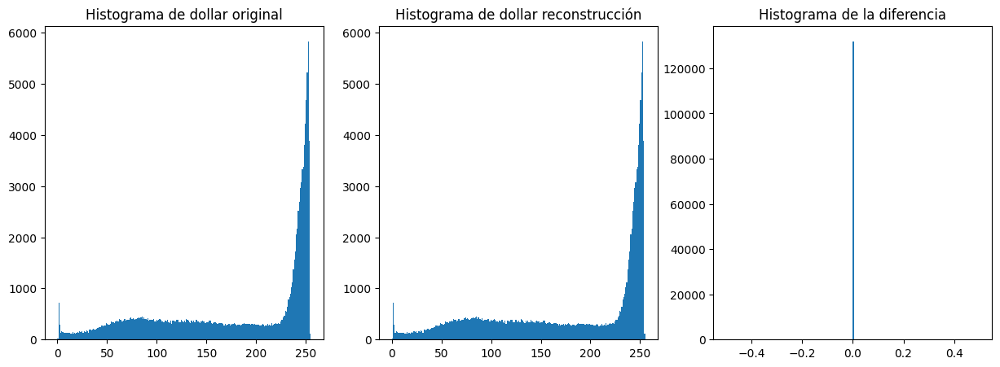

In [126]:
bps_selections = [
    [7],
    [6, 7],
    [5, 6, 7],
    [4, 5, 6, 7],
    [3, 4, 5, 6, 7],
    [2, 3, 4, 5, 6, 7],
    [1, 2, 3, 4, 5, 6, 7],
    [0, 1, 2, 3, 4, 5, 6, 7]
]

for bps_selection in bps_selections:
  restored_dollar = restore_with_bplanes(dollar_bitplanes, bps_selection)
  dollar_diff = dollar - restored_dollar

  fig, axs = plt.subplots(1, 3, figsize=(16, 5))

  axs[0].imshow(restored_dollar, cmap='gray')
  axs[0].set_title(f'restaurado con bitplanes {bps_selection}')
  axs[0].axis('off')

  axs[1].imshow(dollar, cmap='gray')
  axs[1].set_title(f'original')
  axs[1].axis('off')

  axs[2].imshow(dollar_diff, cmap='gray')
  axs[2].set_title(f'diferencia')
  axs[2].axis('off')

  plt.show()

  fig, axs = plt.subplots(1, 3, figsize=(15, 5))

  axs[0].hist(dollar.flatten(), bins=256)
  axs[0].set_title('Histograma de dollar original')

  axs[1].hist(restored_dollar.flatten(), bins=256)
  axs[1].set_title('Histograma de dollar reconstrucción')

  axs[2].hist(dollar_diff.flatten(), bins=256)
  axs[2].set_title('Histograma de la diferencia')

  plt.show()

  print("\n\n")


> Ya solo tomando los bitplanes 6 y 7, no se pierde información en términos de caracteres.

Observemos ahora partiendo del bitplane 0, y agregando los demás.

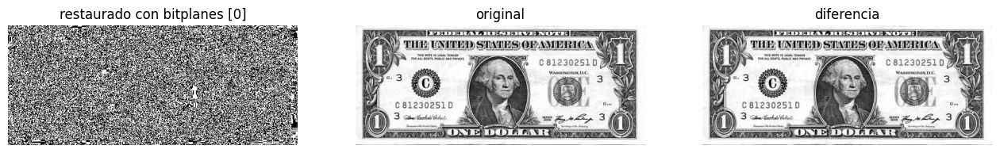

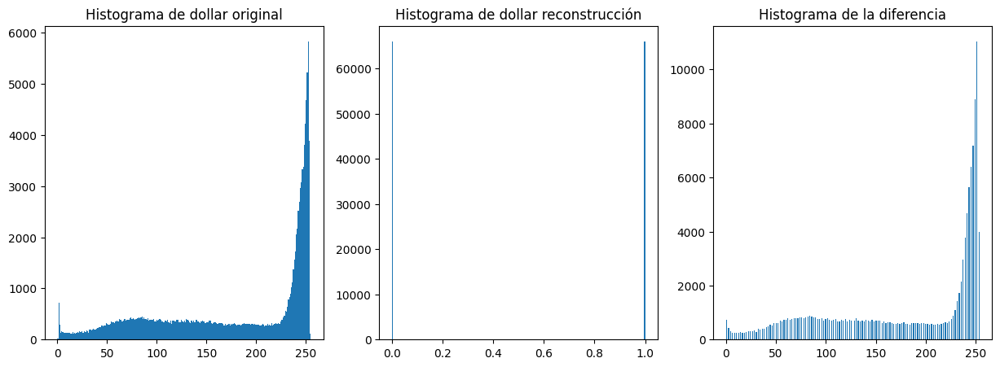

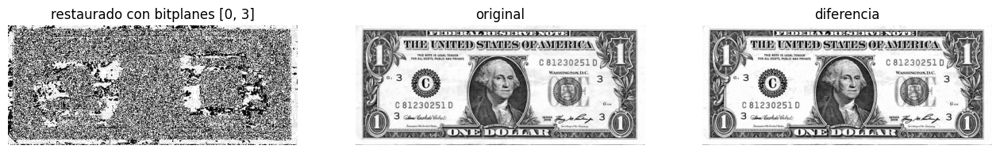

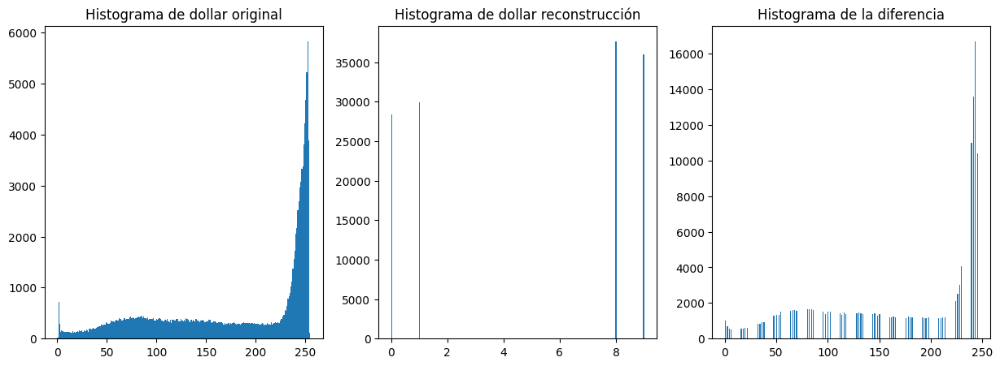

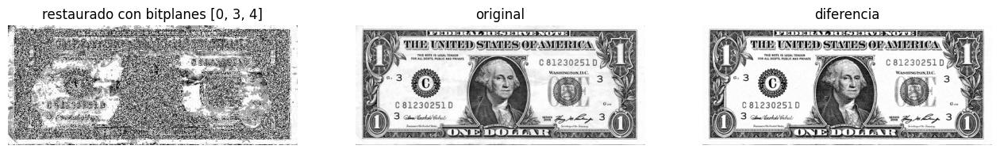

...

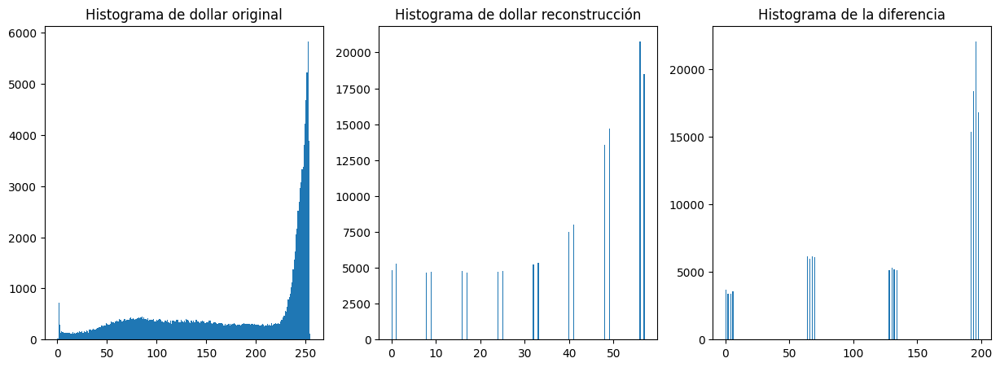

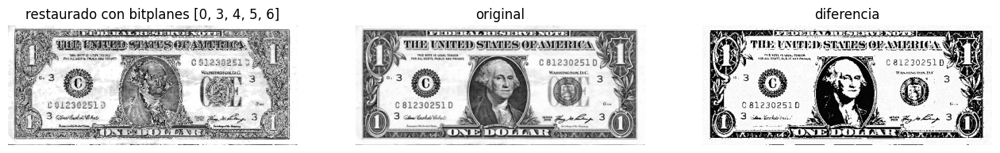

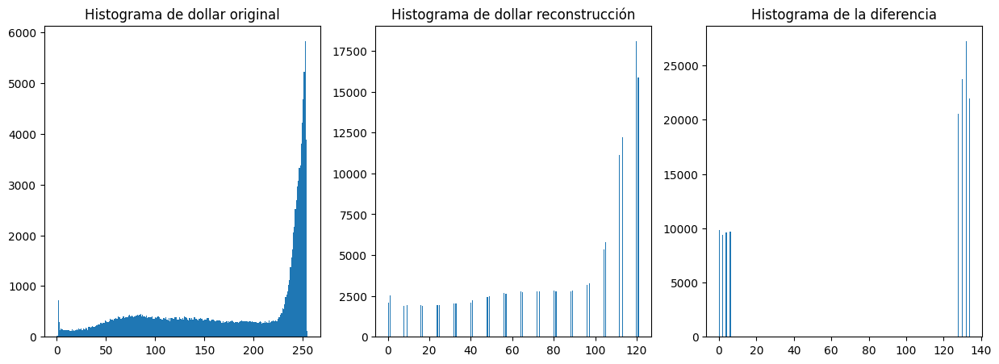

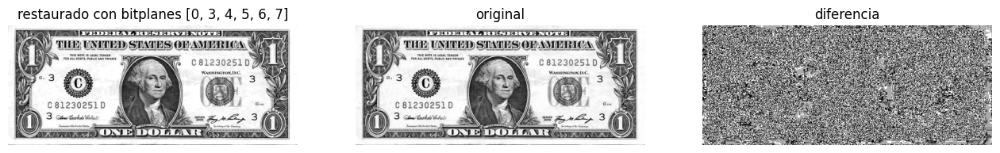

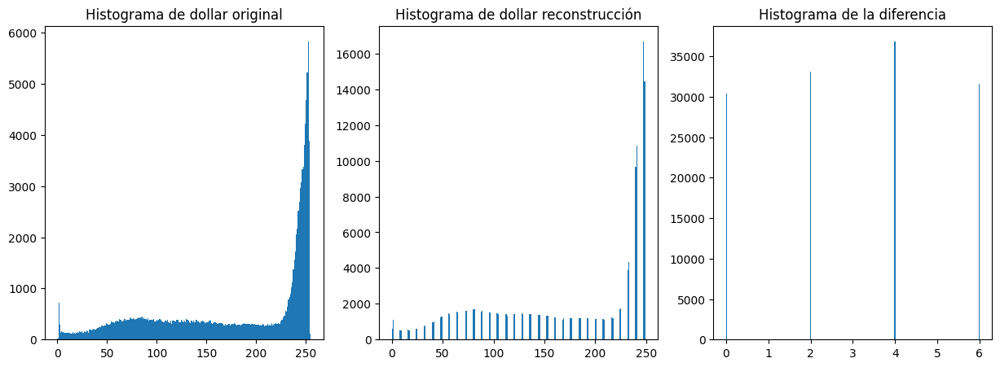

In [127]:
bps_selections = [
    [0],
    [0, 3],
    [0, 3, 4],
    [0, 3, 4, 5],
    [0, 3, 4, 5, 6],
    [0, 3, 4, 5, 6, 7],
]

for bps_selection in bps_selections:
  restored_dollar = restore_with_bplanes(dollar_bitplanes, bps_selection)
  dollar_diff = dollar - restored_dollar

  fig, axs = plt.subplots(1, 3, figsize=(16, 5))

  axs[0].imshow(restored_dollar, cmap='gray')
  axs[0].set_title(f'restaurado con bitplanes {bps_selection}')
  axs[0].axis('off')

  axs[1].imshow(dollar, cmap='gray')
  axs[1].set_title(f'original')
  axs[1].axis('off')

  axs[2].imshow(dollar_diff, cmap='gray')
  axs[2].set_title(f'diferencia')
  axs[2].axis('off')

  plt.show()

  fig, axs = plt.subplots(1, 3, figsize=(15, 5))

  axs[0].hist(dollar.flatten(), bins=256)
  axs[0].set_title('Histograma de dollar original')

  axs[1].hist(restored_dollar.flatten(), bins=256)
  axs[1].set_title('Histograma de dollar reconstrucción')

  axs[2].hist(dollar_diff.flatten(), bins=256)
  axs[2].set_title('Histograma de la diferencia')

  plt.show()

  print("\n\n")


# Ejercicio 4

El histograma de una imagen es una gráfica que muestra la distribución de intensidades de los pixeles de una imagen en escala de grises o RGB. Esta información podría utilizarse para ajustar el brillo o el contraste de la imágen.

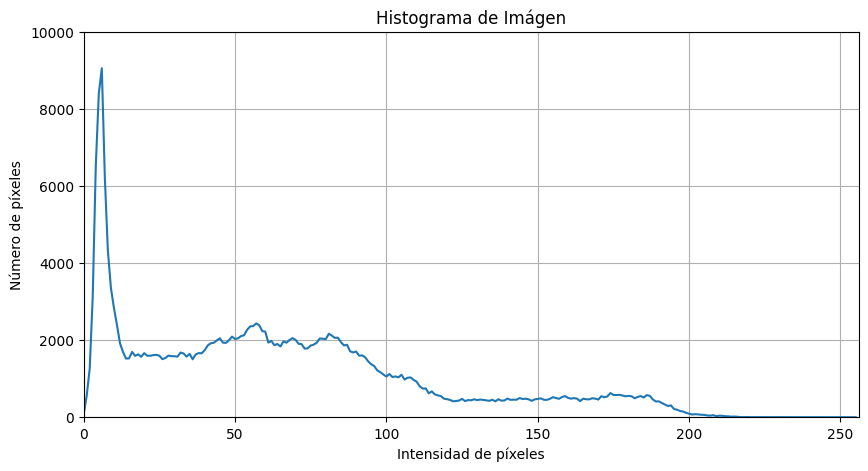

In [128]:
# Cargar la imagen en escala de grises
imagen = cv.imread('lena_gray.tif', cv.IMREAD_GRAYSCALE)

def plot_hist(imagen):
  histograma = cv.calcHist([imagen], [0], None, [256], [0, 256])

  plt.plot(histograma)
  plt.xlim([0, 256])
  plt.ylim([0, 10000])

plt.figure(figsize=(10, 5))
plt.title('Histograma de Imágen')
plt.xlabel("Intensidad de píxeles")
plt.ylabel("Número de píxeles")
plot_hist(imagen)
plt.grid()
plt.show()

# Ejercicio 5

El brillo indica la intensidad luminosa de la imágen, es decir, aumentar el brillo implica tener una mayor cantidad de bits con valores más cercanos a 1 (blanco). En terminos espectrales, se puede pensar el brillo como una componente de continua, la cual modifica la intensidad de todos los pixeles de la misma manera.

Por otra parte, el contraste representa la diferencia de valor entre los pixeles más claros y los más oscuros. Esto se logra multiplicando el valor de todos los pixeles por un valor $\alpha$, tal que si $0 < \alpha < 1$ el contraste disminuye, y si $\alpha > 1$ el contraste aumenta. Cabe destacar que en ambos casos se reduce la cantidad de niveles de cuantización de la imágen. Además, al disminuir el contraste, más pixeles saturarán en 0 (negro), y al aumentarlo saturarán en 1 (blanco).

En el ejercicio 6 se muestra un ejemplo de lo anterior, aplicado a la imágen de Lena.

# Ejercicio 6


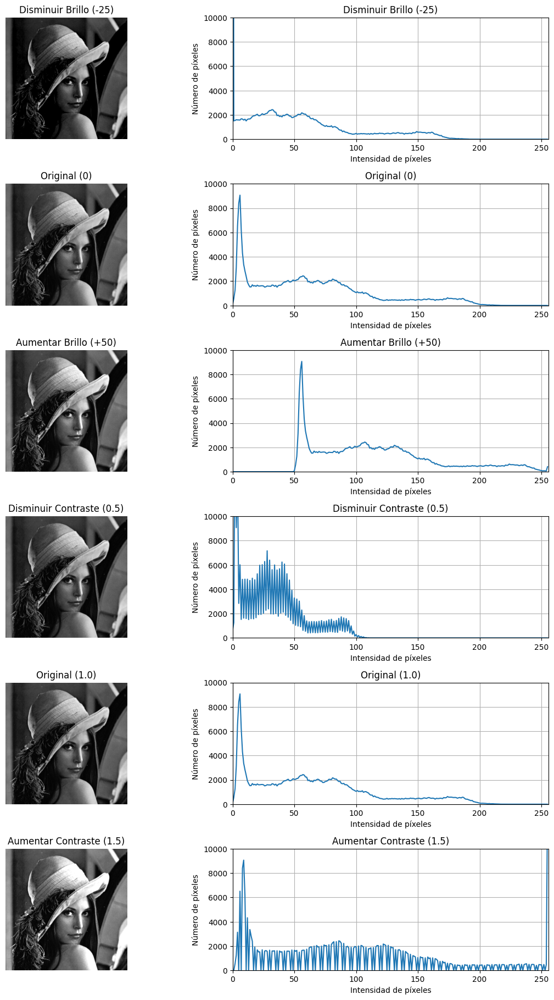

In [129]:
# Cargar la imagen en escala de grises
image = cv.imread('lena_gray.tif', cv.IMREAD_GRAYSCALE)

def adjust_brightness(image, brightness=0):
    return cv.add(image, brightness)

def adjust_contrast(image, contrast=1):
    return cv.addWeighted(image, contrast, np.zeros(image.shape, image.dtype), 0, 0)

# Ajustes de brillo y contraste
images = []
titles = ['Disminuir Brillo (-25)',
          'Original (0)',
          'Aumentar Brillo (+50)',
          'Disminuir Contraste (0.5)',
          'Original (1.0)',
          'Aumentar Contraste (1.5)']

images.append(adjust_brightness(image, brightness=-25))
images.append(image)
images.append(adjust_brightness(image, brightness=50))
images.append(adjust_contrast(image, contrast=0.5))
images.append(image)
images.append(adjust_contrast(image, contrast=1.5))

# Visualizar las imágenes
plt.figure(figsize=(12, 36))
for i in range(len(images)):
    plt.subplot(12, 2, 2 * i + 1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

    plt.subplot(12, 2, 2 * i + 2)
    plot_hist(images[i])
    plt.title(titles[i])
    plt.xlabel("Intensidad de píxeles")
    plt.ylabel("Número de píxeles")
    plt.grid()
    plt.axis('on')

plt.tight_layout()
plt.show()


# Ejercicio 7

La ecualización de histograma es una técnica de procesamiento de imágenes utilizada para mejorar el contraste de una imagen. Consiste en redistribuir los valores de intensidad de los píxeles de una imagen de manera que el histograma de la imagen resultante se extienda por todo el rango posible de intensidades. Esto es especialmente útil en imágenes que son demasiado oscuras o claras, ya que puede ayudar a revelar detalles ocultos.

Para entender mejor el funcionamiento, realizamos la función de ecualización manualmente.

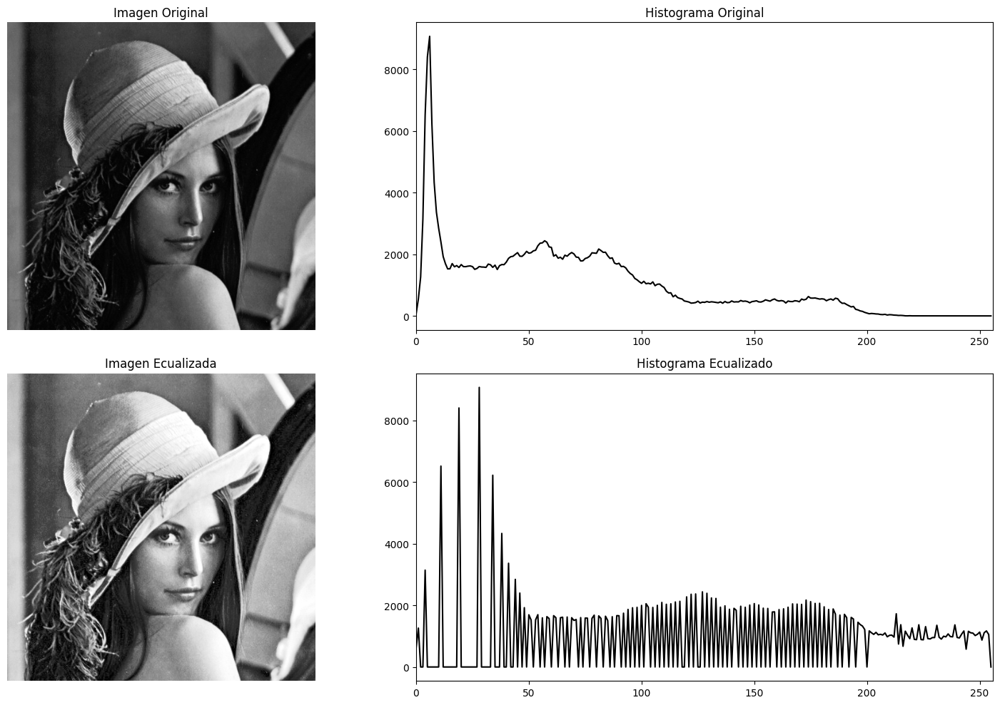

In [130]:
# Cargar la imagen en escala de grises
image = cv.imread('lena_gray.tif', cv.IMREAD_GRAYSCALE)

# Ecualizar el histograma
def equalize_hist(image):
    # Calcular el histograma
    hist = cv.calcHist([image], [0], None, [256], [0, 256])

    # Calcular la CDF (Función de Distribución Acumulativa)
    cdf = hist.cumsum()           # Sumar acumulativamente el histograma
    cdf_min = cdf[cdf > 0].min()  # Encontrar el valor mínimo de la CDF que es mayor que cero

    # Normalizar la CDF
    # cdf_min --> 0     cdf_max --> 255
    cdf_normalized = (cdf - cdf_min) * 255 / (cdf.max() - cdf_min)

    # Asignar nuevos valores de intensidad
    image_equalized = np.interp(image.flatten(), np.arange(256), cdf_normalized).reshape(image.shape).astype(np.uint8)

    return image_equalized

equalized_image = equalize_hist(image)

# Visualizar imágenes e histogramas
plt.figure(figsize=(16, 10))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(2, 2, 2)
hist_original = cv.calcHist([image], [0], None, [256], [0, 256])
plt.plot(hist_original, color='black')
plt.title('Histograma Original')
plt.xlim([0, 256])

plt.subplot(2, 2, 3)
plt.imshow(equalized_image, cmap='gray')
plt.title('Imagen Ecualizada')
plt.axis('off')

plt.subplot(2, 2, 4)
hist_equalized = cv.calcHist([equalized_image], [0], None, [256], [0, 256])
plt.plot(hist_equalized, color='black')
plt.title('Histograma Ecualizado')
plt.xlim([0, 256])

plt.tight_layout()
plt.show()

# Ejercicio 8 - HDR

High Dynamic Range (HDR) Imaging

Investigar que es HDR y aplicarlo a las imágenes `office_x.jpg` (x=1-6)

Tiempos de exposicion : [0.0333, 0.1000, 0.3333, 0.6250, 1.3000, 4.0000];

Leer https://www.learnopencv.com/high-dynamic-range-hdr-imaging-using-opencv-cpp-python/

## Contexto

HDR (High Dynamic Range) es una técnica que permite adquirir imágenes con gran rango dinámico en sus valores/niveles de intensidad, situaciones en las que 8bits de codificación resulta limitado, produciendo clipping a $0$ (para zonas muy oscuras) o $255$ (para las muy brillantes).

La idea es tomar varias capturas de una misma imágen, con distintas
configuraciones de **exposición** (exposure), que se relaciona con cuánta luz alcanza/adquiere el sensor de la cámara. Así, puedo caer en situaciones de underexposure, cuando poca luz llega el sensor, dando imágen oscura; o de overexposure, situación contraria.

Esta exposición queda determinada por la apertura (aperture) del lente, la velocidad del obturador (shutter speed) y la ISO (sensibilidad del sensor a la luz). En general, se suele variar el **tiempo de exposición**: cuánto tiempo el sensor está adquiriendo información.

En el sitio de referencia, se plantea como ejemplo el modo HDR de un iPhone, el cual realiza 3 capturas:
- Una imagen underexposed: más oscura, para capturar las zonas brillantes.
- Una imagen properly exposed: en la configuración automática/por defecto según la iluminación que se detecte.
- Una imagen overexposed: más brillante, para capturar las zonas oscuras.

La intención es, entonces, procesamiento mediante,componer una imagen final a partir de las anteriores, en las que se pueda caracterizar de mejor manera todo el rango dinámico de la escena.

Una vez obtenidas capturas a distinta exposición, deben **alinearse**, ya que fueron tomadas en distintos instantes de tiempo, próximos pero distintos, pudiendo haber leves variaciones espaciales, apareciendo *artefactos*.




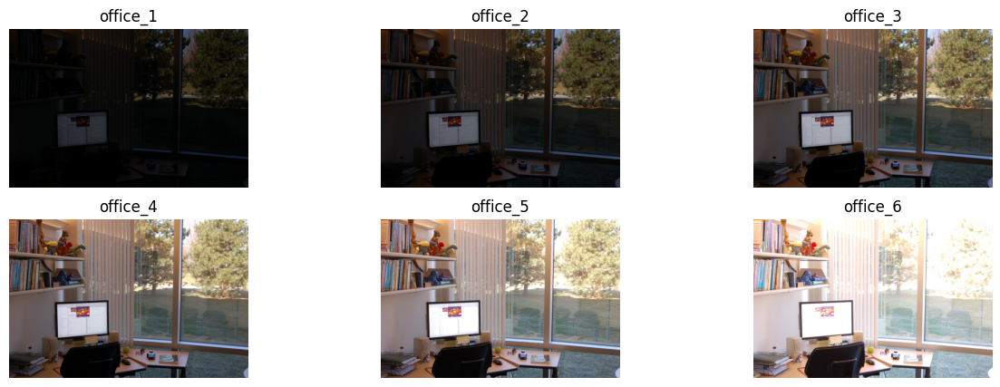

In [131]:
office_imgs = []
for i in range(1, 7):
  image = iio.imread(f'office_{i}.jpg')
  office_imgs.append(image)

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, image in enumerate(office_imgs):
  row = i // 3
  col = i % 3
  axs[row, col].imshow(image)
  axs[row, col].set_title(f'office_{i+1}')
  axs[row, col].axis('off')

plt.show()

## 1° - Carga de imágenes con distintos tiempos de exposición (conocidos)

In [132]:
img_fn = ["office_1.jpg", "office_2.jpg", "office_3.jpg", "office_4.jpg", "office_5.jpg", "office_6.jpg"]
img_list = [cv.imread(fn) for fn in img_fn]
exposure_times = np.array([0.0333, 0.1000, 0.3333, 0.6250, 1.3000, 4.0000], dtype=np.float32)

In [133]:
!mkdir -p hdr_output

## 2° - Alineación de las imágenes - MTB

AlignMTB covniernte todas las imágenes en Median Threshold Bitmaps, en donde se asigna 1 a pixeles más brillantes que la luminancia media, y 0 en caso contrario. Esta característica NO depende del tiempo de exposición, por lo que es posible alinear en el dominio MTB sin necesitar los tiempos de exposición.

In [134]:
alignMTB = cv.createAlignMTB()
alignMTB.process(img_list, img_list)

Debajo se presenta una implementación manual de la conversión a MTB para cada imagen (AlignMTB lo resuelve internamente), observándose la prácticamente igualdad entre las 6, a pesar de corresponder a distintos tiempos de exposición.

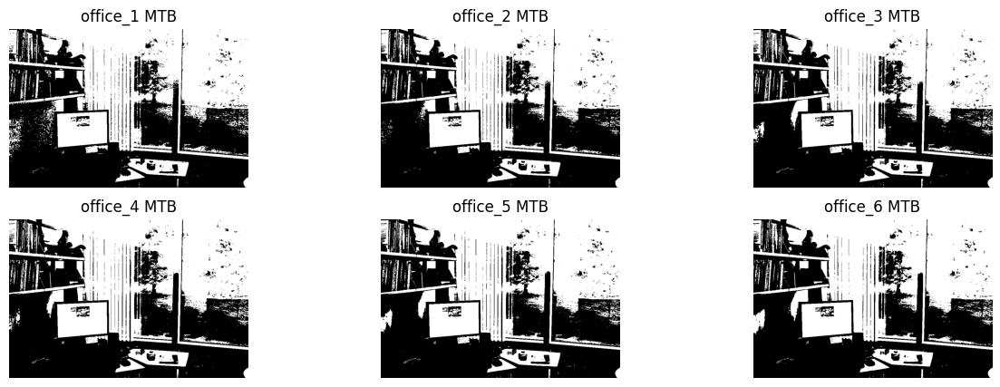

In [135]:
def to_mtb(image):
  gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  median = np.median(gray)
  mtb = (gray > median).astype(np.uint8) * 255
  return mtb

mtb_images = [to_mtb(image) for image in img_list]

fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, mtb_image in enumerate(mtb_images):
  row = i // 3
  col = i % 3
  axs[row, col].imshow(mtb_image, cmap='gray')
  axs[row, col].set_title(f'office_{i+1} MTB')
  axs[row, col].axis('off')

plt.show()

## 3° - Recuperación de la CRF, Camera Response Function

Una cámara no responde de igual manera para todas las condiciones de brillo posibles, y mucho menos lo hará de forma lineal. Teniendo 6 capturas a distintas exposiciones, al momento de unirlas/promediarlas, es neceserario linealizar las intensidades para que no haya aportes desiguales de cada una.

Entonces, buscamos estimar la CRF **inversa** de la cámara para poder aplicarla a las imágenes y linealizarlas.

opencv implementa dos algoritmos para lograrlo:
* [Debevec](https://www.pauldebevec.com/Research/HDR/debevec-siggraph97.pdf)
* [Robertson](https://www.seanborman.com/publications/JEI00219.pdf)

In [136]:
calibrateDebevec = cv.createCalibrateDebevec()
responseDebevec = calibrateDebevec.process(img_list, exposure_times)

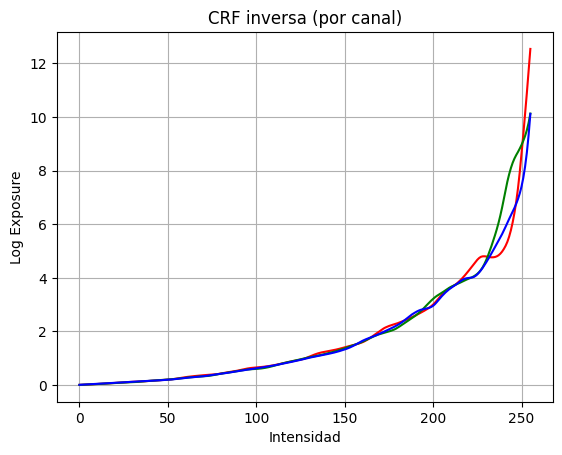

In [137]:
colors = ['r', 'g', 'b']

for i in range(3):
  plt.plot(responseDebevec[:, 0, i], color=colors[i])

plt.title('CRF inversa (por canal)')
plt.xlabel('Intensidad')
plt.ylabel('Log Exposure')
plt.grid(True)
plt.show()

## 4° - Merge de la tomas

In [138]:
merge_debevec = cv.createMergeDebevec()
hdr_debevec = merge_debevec.process(img_list, times=exposure_times.copy(), response=responseDebevec.copy())

In [139]:
cv.imwrite("hdr_output/office_hdr.hdr", hdr_debevec.astype(np.float32))

True

## 5° - Tone mapping

*El tema* está en cómo mapeamos todo el rango de intensidades (idealmente infinito) en 8bits para ser mostrado en una pantalla.

**Tone mapping: proceso para convertir imagen HDR en una de 8bits x 3canales, buscando preservar la mayor cantidad de detalles.**

Hay distintos algoritmos de tone mapping, apuntados a obtener distintos resultados, como producir imágenes realistas o mismo surrealistas.

opencv implementa 4 algoritmos:
* Default: mapeador lineal, con corrección gamma
* Drago tonemap
* Reinhard tonemap
* Mantiuk tonemap

Algunos parámetros comunes entre los algoritmos son:
* `gamma`: comprime el rando dinámico mediante una corrección gamma. 1.0 no aplica correción. Menor a 1.0 oscurece; mayor a 1 aumenta el brillo.
* `saturation`: valores altos intensifican los clores; valores cercanos a ceros, hacen tender los colores a gris.
* `contrast`

> La elección de estos parámetros tiene mucha componente subjetiva; resultan de ensayo y error.

Default tonemap:


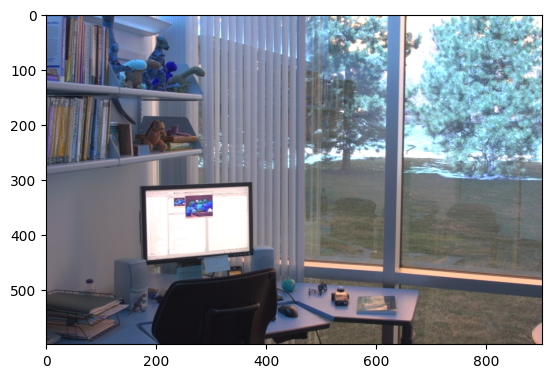


Drago tonemap:


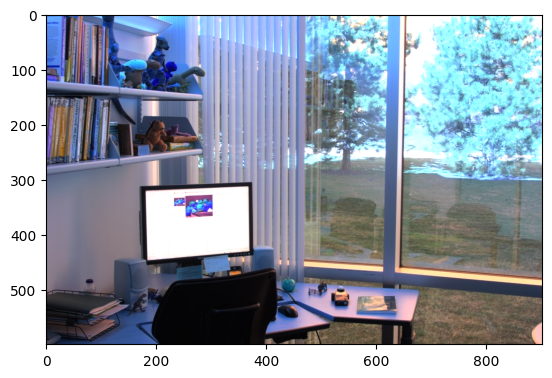


Reinhard tonemap:


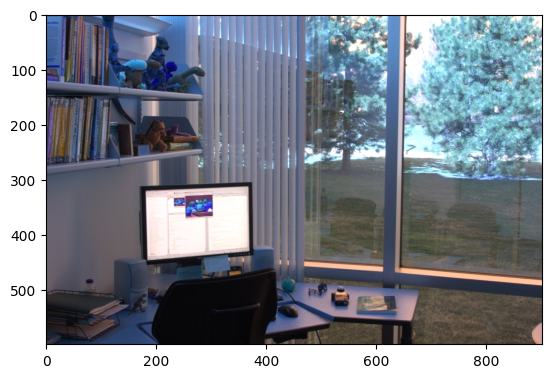


Mantiuk tonemap:


<ipython-input-140-b951d943f9d2>:32: RuntimeWarning: invalid value encountered in cast
  ldr_mantiuk = np.clip(ldr_mantiuk * 255, 0, 255).astype('uint8')


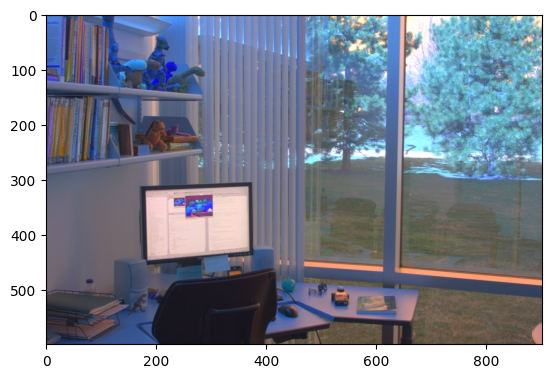

In [140]:
print("Default tonemap:")
tonemap = cv.createTonemap(2.2)
ldr = tonemap.process(hdr_debevec.copy())
ldr = 2.5 * ldr
ldr = np.clip(ldr * 255, 0, 255).astype('uint8')
cv.imwrite("hdr_output/office_ldr.jpg", ldr)
plt.imshow(ldr)
plt.show()

print("\nDrago tonemap:")
tonemap_drago = cv.createTonemapDrago(saturation=0.7)
ldr_drago = tonemap_drago.process(hdr_debevec.copy())
ldr_drago = 2.5 * ldr_drago
ldr_drago = np.clip(ldr_drago * 255, 0, 255).astype('uint8')
cv.imwrite("hdr_output/office_ldr_drago.jpg", ldr_drago)
plt.imshow(ldr_drago)
plt.show()

print("\nReinhard tonemap:")
tonemap_reinhard = cv.createTonemapReinhard(gamma=1.5, intensity=0.0, light_adapt=0.0, color_adapt=0.0)
ldr_reinhard = tonemap_reinhard.process(hdr_debevec.copy())
ldr_reinhard = 1.5 * ldr_reinhard
ldr_reinhard = np.clip(ldr_reinhard * 255, 0, 255).astype('uint8')
cv.imwrite("hdr_output/office_ldr_reinhard.jpg", ldr_reinhard)
plt.imshow(ldr_reinhard)
plt.show()

print("\nMantiuk tonemap:")
tonemap_mantiuk = cv.createTonemapMantiuk(gamma=1.8, scale=0.85, saturation=1.2)
ldr_mantiuk = tonemap_mantiuk.process(hdr_debevec.copy())
ldr_mantiuk = 2 * ldr_mantiuk
ldr_mantiuk = np.clip(ldr_mantiuk * 255, 0, 255).astype('uint8')
cv.imwrite("hdr_output/office_ldr_mantiuk.jpg", ldr_mantiuk)
plt.imshow(ldr_mantiuk)
plt.show()


## Exposure fusion (Mertens)

Paper original: https://web.stanford.edu/class/cs231m/project-1/exposure-fusion.pdf

Referencia práctica: https://learnopencv.com/exposure-fusion-using-opencv-cpp-python/

> Exposure Fusion is a method for combining images taken with different exposure settings into one image that looks like a tone mapped High Dynamic Range (HDR) image.

Este algoritmo ofrece otro camino para unir las imágenes de distinta exposición, teniendo las siguientes características destacables:
* Produce directamente una imagen LDR
* Evita el procesamiento HDR, simplificando el pipeline
* Evita la CRF de la cámara.
* Es computacionalmente eficiente.

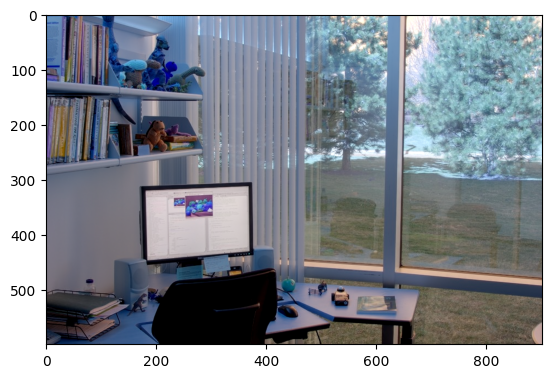

In [141]:
merge_mertens = cv.createMergeMertens()
fusion = merge_mertens.process(img_list)
fusion = np.clip(fusion * 255, 0, 255).astype('uint8')
cv.imwrite("hdr_output/office_ldr_expfusion.jpg", fusion)
plt.imshow(fusion)
plt.show()

## Descarga

In [147]:
!zip -r hdr_output.zip hdr_output
files.download('hdr_output.zip')

updating: hdr_output/ (stored 0%)
updating: hdr_output/office_ldr.jpg (deflated 0%)
updating: hdr_output/office_ldr_expfusion.jpg (deflated 0%)
updating: hdr_output/office_hdr.hdr (deflated 12%)
updating: hdr_output/office_ldr_mantiuk.jpg (deflated 0%)
updating: hdr_output/office_ldr_reinhard.jpg (deflated 0%)
updating: hdr_output/office_ldr_drago.jpg (deflated 0%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>